In [1]:
#Modify the path to a directory on your machine
import os
os.environ["CRDS_PATH"] = "/home/hailin/Documents/CRDS"
os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"

# Packages that allow us to get information about objects:
import asdf
import copy
import shutil

# Numpy library:
import numpy as np

# For downloading data
import requests

# Astropy tools:
from astropy.io import fits
from astropy.utils.data import download_file
from astropy.visualization import ImageNormalize, ManualInterval, LogStretch

import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['mathtext.default'] = 'regular'
import matplotlib as mpl

# Plotting tools:
from pipeline1_plotting_tools import download_files, plot_jump, plot_jumps, plot_ramp, plot_ramps, show_image, side_by_side

# Use this version for non-interactive plots (easier scrolling of the notebook)
%matplotlib inline

# Use this version (outside of Jupyter Lab) if you want interactive plots
#%matplotlib notebook

# List of possible data quality flags
from jwst.datamodels import dqflags

# The entire calwebb_detector1 pipeline
from jwst.pipeline import calwebb_detector1

# Individual steps that make up calwebb_detector1
from jwst.dq_init import DQInitStep
from jwst.saturation import SaturationStep
from jwst.superbias import SuperBiasStep
from jwst.ipc import IPCStep                                                                                    
from jwst.refpix import RefPixStep                                                                
from jwst.linearity import LinearityStep
from jwst.persistence import PersistenceStep
from jwst.dark_current import DarkCurrentStep
from jwst.jump import JumpStep
from jwst.ramp_fitting import RampFitStep
from jwst import datamodels

import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.special import gamma
from scipy.optimize import curve_fit, minimize

import jwst
print(jwst.__version__)

1.19.2


In [2]:
input_file_category = '3000s_exposure_blind'
input_file_base = 'jw01121012001_02102_00001_nrs2'
# 现把整个程序重写一遍，加上jump mask
# JWST原始数据导入和展示
# linearity_file  = '../data/JWST/' + input_file_base + '/' + input_file_base + '_linearitystep.fits'
# linearity  = datamodels.open(linearity_file)
# linearity_photo = linearity.data[0,-1,:,:] - linearity.data[0,0,:,:]
# linearity_photo_flatten = linearity_photo.flatten()
jump_file = '../data/JWST/' + input_file_category + '/' + input_file_base + '/' + input_file_base + '_jumpstep.fits'
jump = datamodels.open(jump_file)
n_group = jump.data.shape[1]
print('group number is {}'.format(n_group))

# Create a 4-dimensional map of the jump flags
jump_map = (jump.groupdq & dqflags.pixel['JUMP_DET'] > 0)
# Collapse down to a 2D map of the number of flagged jumps in each pixel
jump_map_2d = np.sum(jump_map[0, :, :, :], axis=0)
# Determine how many pixels have jump flags
jump_map_indexes = np.where(jump_map_2d > 0)
impacted_pix = np.sum(jump_map_2d > 0)
total_pix = 2048 * 2048
print(('{} pixels ({:.2f}% of the detector) have been flagged with '
      'at least one jump.'.format(impacted_pix, 100. * impacted_pix / total_pix)))

photo_start = 0
photo_end   = n_group - 1
# bin 的范围
dn_min = -200
dn_max = 400
dn_range = range(dn_min, dn_max)

# Create a 4-dimensional map of ANY flags
dq_map_2d = np.sum(jump.groupdq[0, photo_start:photo_end+1, :, :] > 0, axis=0)
# Determine how many pixels are not GOOD
dq_map_indexes = np.where(dq_map_2d > 0)
bad_pix = np.sum(dq_map_2d > 0)
total_pix = 2048 * 2048
print(('{} pixels ({:.2f}% of the detector) has been flagged'.format(bad_pix, 100. * bad_pix / total_pix)))

pre_mask = jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:]

raw_photo_1 = jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:]
raw_photo_1[jump_map_indexes] = np.nan
raw_photo_flatten_1 = raw_photo_1.flatten()
nan_mask_1 = np.isnan(raw_photo_flatten_1)
photo_no_jump_flatten = raw_photo_flatten_1[~nan_mask_1]

raw_photo_2 = jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:]
raw_photo_2[dq_map_indexes] = np.nan
raw_photo_flatten_2 = raw_photo_2.flatten()
nan_mask_2 = np.isnan(raw_photo_flatten_2)
photo_good_flatten = raw_photo_flatten_2[~nan_mask_2]

# 用 range(dn_min, dn_max+1) to include dn_max
plt.figure(figsize=(12, 5))
plt.hist(photo_no_jump_flatten, bins=range(dn_min, dn_max+1), alpha=0.8, color='blue',edgecolor='black',log=True)
plt.hist(photo_good_flatten, bins=range(dn_min, dn_max+1), alpha=0.8, color='red',edgecolor='black',log=True)
# 设置边缘颜色的透明度
for patch in plt.gca().patches:
    patch.set_edgecolor((1, 1, 1, 0.2))  # RGBA格式 (红, 绿, 蓝, 透明度)
legend_elements = [
    Line2D([0], [0], color='b', lw=2, label='only jump flag'),
    Line2D([0], [0], color='r', lw=2, label='full pipeline flag')
]
plt.legend(handles=legend_elements, fontsize=12, loc='upper right', title_fontsize='13', frameon=True)
plt.title('Pixel Value Distribution')
plt.xlabel('DN')
plt.ylabel('Number of Pixels')
plt.ylim(1,1e6)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '../data/JWST/3000s_exposure_blind/jw01121012001_02102_00001_nrs2/jw01121012001_02102_00001_nrs2_jumpstep.fits'

In [3]:
jump.meta.instance

{'aperture': {'name': 'NRS2_FULL',
  'position_angle': 56.719593674785,
  'pps_name': 'NONE'},
 'bunit_data': 'DN',
 'cal_step': {'dq_init': 'COMPLETE',
  'ipc': 'COMPLETE',
  'jump': 'COMPLETE',
  'linearity': 'COMPLETE',
  'persistence': 'SKIPPED',
  'refpix': 'COMPLETE',
  'saturation': 'COMPLETE',
  'superbias': 'COMPLETE'},
 'calibration_software_revision': 'RELEASE',
 'calibration_software_version': '1.15.1',
 'compress': False,
 'coordinates': {'reference_frame': 'ICRS'},
 'data_processing_software_version': '2024_1a',
 'date': '2024-10-02T18:43:54.763',
 'dither': {'position_number': 1,
  'total_points': 1,
  'x_offset': 0.0,
  'y_offset': 0.0},
 'ephemeris': {'reference_frame': 'EME2000',
  'spatial_x_bary': -146682409.66638806,
  'spatial_x_geo': -1002916940.8559967,
  'spatial_y_bary': 32942095.015503943,
  'spatial_y_geo': 851916677.3202062,
  'spatial_z_bary': 14385708.145961229,
  'spatial_z_geo': 444141364.72673947,
  'time': 59645.444449982984,
  'type': 'Definitive',
 

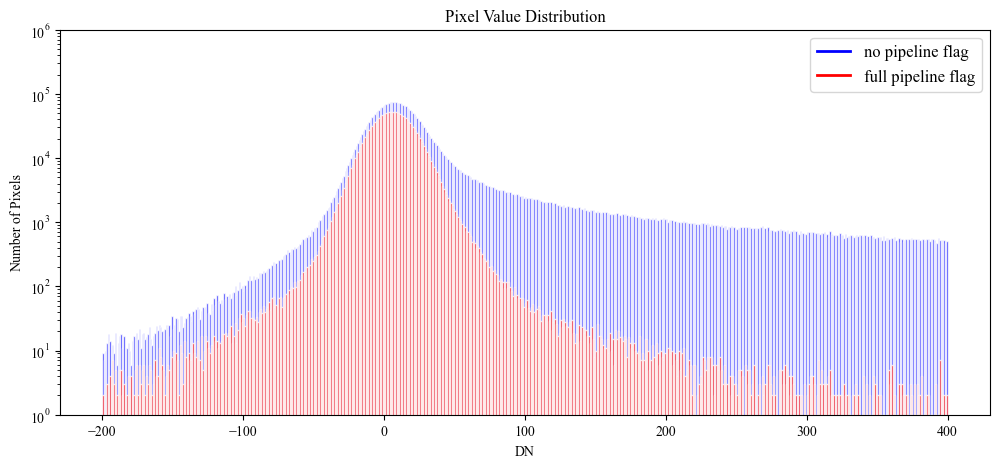

In [4]:
plt.figure(figsize=(12, 5))
plt.hist(pre_mask.flatten(), bins=range(dn_min, dn_max+1), alpha=0.8, color='blue',edgecolor='black',log=True)
plt.hist(photo_good_flatten, bins=range(dn_min, dn_max+1), alpha=0.8, color='red',edgecolor='black',log=True)
# 设置边缘颜色的透明度
for patch in plt.gca().patches:
    patch.set_edgecolor((1, 1, 1, 0.2))  # RGBA格式 (红, 绿, 蓝, 透明度)
legend_elements = [
    Line2D([0], [0], color='b', lw=2, label='no pipeline flag'),
    Line2D([0], [0], color='r', lw=2, label='full pipeline flag')
]
plt.legend(handles=legend_elements, fontsize=12, loc='upper right', title_fontsize='13', frameon=True)
plt.title('Pixel Value Distribution')
plt.xlabel('DN')
plt.ylabel('Number of Pixels')
plt.ylim(1,1e6)
plt.show()

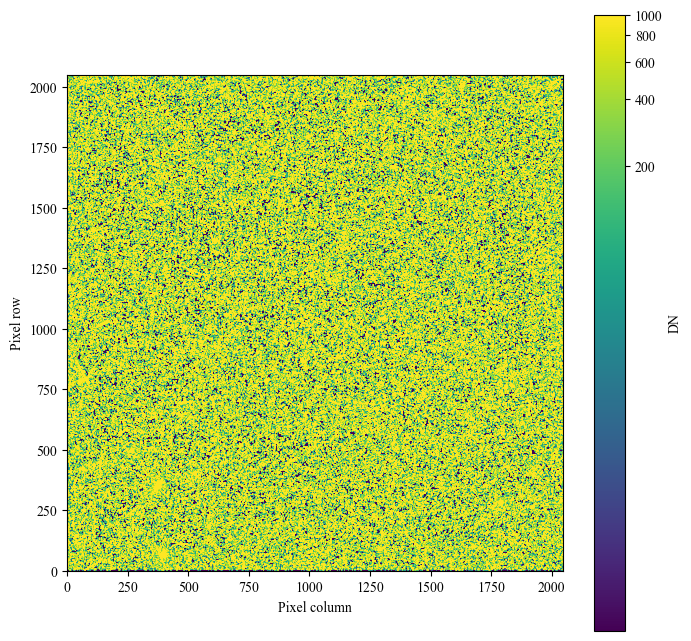

In [5]:
show_image(jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:],20,1000)

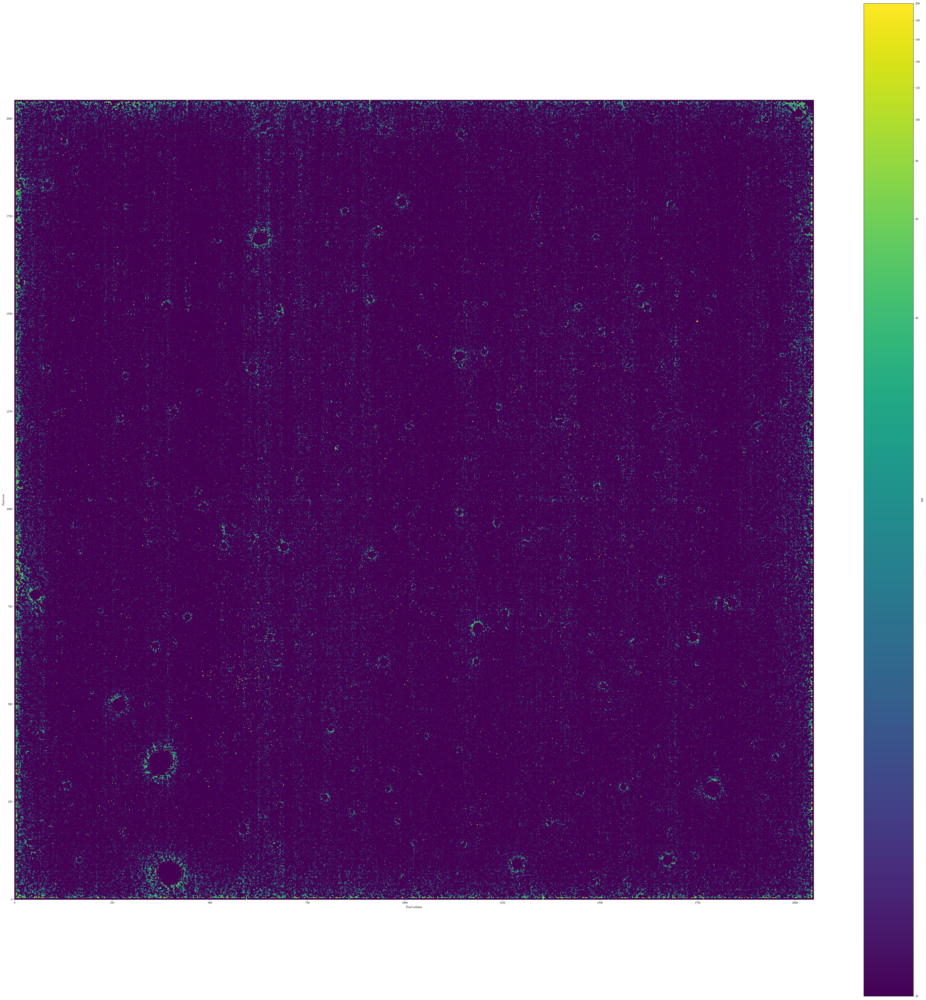

In [6]:
# 直接把bad pixels设成0才好作图先看一眼
photo_zero_bad = jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:]
photo_zero_bad[dq_map_indexes] = 0

photo = photo_zero_bad
mask = np.zeros_like(photo, dtype=bool)
mask = (dq_map_2d > 0)

# 创建一个自定义的颜色映射，将掩膜区域设置为透明
cmap = cm.viridis
cmap.set_bad(color='orange', alpha=1) 

# 将掩膜应用于数据
masked_data = np.ma.array(photo, mask=mask)

norm = ImageNormalize(photo, interval=ManualInterval(vmin=20, vmax=200),stretch=LogStretch())
fig = plt.figure(figsize=(60, 60))

ax = fig.add_subplot(1, 1, 1)
im = ax.imshow(photo, origin='lower',norm = norm)

# 设置网格
#ax.set_xticks(np.arange(-0.5, 2048, 32))
#ax.set_yticks(np.arange(-0.5, 2048, 32))
#ax.set_xticklabels(np.arange(0, 2048+1, 32))
#ax.set_yticklabels(np.arange(0, 2048+1, 32))
#ax.grid(color='white', linestyle='-', linewidth=0.5)
#ax.tick_params(axis='both', which='major', labelsize=6,top=True, bottom=True, left=True, right=True)
#ax.xaxis.set_tick_params(labeltop=True, labelbottom=True)
#ax.yaxis.set_tick_params(labelleft=True, labelright=True)

fig.colorbar(im,label = 'DN')
plt.xlabel('Pixel column')
plt.ylabel('Pixel row')
plt.show()

In [7]:
# c stands for control:
c_delta_mask   = True
c_bad_mosaic   = True
c_secondary    = True
c_edge         = True
c_brightness   = True

mosaic_size = 16
mask_perc_thr_1  = 0.9
secondary_size_1 = 3
mask_perc_thr_2  = 0.6
secondary_size_2 = 1
edge_width = 32
brightness_thr  = 150
brightness_size = 2
delta_thr = 60

In [8]:
photo = photo_zero_bad
mask = np.zeros_like(photo, dtype=bool)
pipeline_mask = (dq_map_2d > 0)

# 这次我们直接从超亮pixel的分布入手，mask掉超亮pixel周围的pixel
# 并且这次设计两套bad mask。越亮的区域需要的secondary越大。
bad_mask = np.zeros_like(photo, dtype=bool)
mosaic_area = mosaic_size**2
mosaic_half = int(mosaic_size / 2)
N_mosaic = int(2048 / mosaic_size)
bad_mosaic_1 = np.zeros((N_mosaic, N_mosaic), dtype=bool)
bad_mosaic_2 = np.zeros((N_mosaic, N_mosaic), dtype=bool)
if c_bad_mosaic:
    bad_mosaic_count = np.zeros((N_mosaic, N_mosaic))
    # 现在可以直接从dq_map_indexes出发，对其进行pixel内的计数
    bad_pix_map = (dq_map_2d > 0)
    # 热力图，但是不带已经flagged的
    for y in range(N_mosaic):  # jwst 指标先y后x
        for x in range(N_mosaic):
            bad_mosaic_count[y,x] = np.sum(bad_pix_map[y*mosaic_size:(y+1)*mosaic_size, x*mosaic_size:(x+1)*mosaic_size])
    # 把马赛克化的mask汇总于此：
    bad_mosaic_1  = (bad_mosaic_count/mosaic_area >mask_perc_thr_1)
    bad_mosaic_2  = (bad_mosaic_count/mosaic_area >mask_perc_thr_2)

#cols_mosaic = np.zeros((N_mosaic, N_mosaic), dtype=bool)
#cols_mosaic[:,-14:-12] = True
#cols_mosaic[:,28:30] = True
#cols_mosaic[:,-4:-2] = True

secondary_mosaic_1 = np.zeros((N_mosaic, N_mosaic), dtype=bool) #coule be the most important
secondary_mosaic_2 = np.zeros((N_mosaic, N_mosaic), dtype=bool)
if c_secondary:
    for y in range(N_mosaic):  # jwst 指标先y后x
        for x in range(N_mosaic):
            if  bad_mosaic_1[y,x] :
                y_min = np.max([y-secondary_size_1,0])
                x_min = np.max([x-secondary_size_1,0])
                y_max = np.min([y+secondary_size_1,N_mosaic-1])
                x_max = np.min([x+secondary_size_1,N_mosaic-1])
                # circle mask:
                for y2 in range(y_min,y_max+1):
                    for x2 in range(x_min,x_max+1):
                        if (y2-y)**2 + (x2-x)**2 <= secondary_size_1**2:
                            secondary_mosaic_1[y2,x2] = True
            if  bad_mosaic_2[y,x] :
                y_min = np.max([y-secondary_size_2,0])
                x_min = np.max([x-secondary_size_2,0])
                y_max = np.min([y+secondary_size_2,N_mosaic-1])
                x_max = np.min([x+secondary_size_2,N_mosaic-1])
                # circle mask:
                for y2 in range(y_min,y_max+1):
                    for x2 in range(x_min,x_max+1):
                        if (y2-y)**2 + (x2-x)**2 <= secondary_size_2**2:
                            secondary_mosaic_2[y2,x2] = True

mask_mosaic = bad_mosaic_1  + secondary_mosaic_1 + bad_mosaic_2  + secondary_mosaic_2

for y in range(N_mosaic):  # jwst 指标先y后x
    for x in range(N_mosaic):
        if  mask_mosaic[y,x]:
            bad_mask[y*mosaic_size:(y+1)*mosaic_size, x*mosaic_size:(x+1)*mosaic_size] = True

edge_mask = np.zeros_like(photo, dtype=bool)
if c_edge:
    edge_mask[0:edge_width,:] = True
    edge_mask[-edge_width:,:] = True
    edge_mask[:,0:edge_width] = True
    edge_mask[:,-edge_width:] = True

# brightness_mask排除剩余的过亮点以及周围
brightness_mask = np.zeros_like(photo, dtype=bool)

if c_brightness:
    for y in range(2048):
        for x in range(2048):
            if  np.abs(pre_mask[y,x]) > brightness_thr: # not mask[y,x] and not dq_map_2d[y,x]
                y_min = np.max([y-brightness_size,0])
                x_min = np.max([x-brightness_size,0])
                y_max = np.min([y+brightness_size,2048-1])
                x_max = np.min([x+brightness_size,2048-1])
                # circle mask:
                for y2 in range(y_min,y_max+1):
                    for x2 in range(x_min,x_max+1):
                        if (y2-y)**2 + (x2-x)**2 <= brightness_size**2:
                            brightness_mask[y2,x2] = True


# dev：外加一个delta mask，相当于手搓版的jump mask
delta_mask = np.zeros_like(photo, dtype=bool)
if c_delta_mask:
    jump_data = jump.data[0]
    delta = (jump_data - np.roll(jump_data, 1, axis=0))[1:,:,:]
    delta_map_2d = np.sum(np.abs(delta[:,:,:]) > delta_thr, axis=0)
    #delta_map_2d = np.sum(delta[:,:,:] < -delta_thr, axis=0)
    delta_mask   = (delta_map_2d > 0)

mask = bad_mask + edge_mask + brightness_mask + delta_mask

pixel_after_pipeline = total_pix - bad_pix
pipeline_bad = dq_map_2d + bad_mask
pixel_after_pipeline_bad = total_pix - np.sum(pipeline_bad>0)
bad_ratio = 1 - pixel_after_pipeline_bad/pixel_after_pipeline

pipeline_bad_edge = dq_map_2d + bad_mask + edge_mask
pixel_after_pipeline_bad_edge = total_pix - np.sum(pipeline_bad_edge>0)
edge_ratio = 1 - pixel_after_pipeline_bad_edge/pixel_after_pipeline_bad

pip_bad_edge_bright = dq_map_2d + bad_mask + edge_mask + brightness_mask
pixel_after_pip_bad_edge_bright = total_pix - np.sum(pip_bad_edge_bright>0)
bright_ratio = 1 - pixel_after_pip_bad_edge_bright / pixel_after_pipeline_bad_edge

full = dq_map_2d + bad_mask + edge_mask + brightness_mask + delta_mask
pixel_after_full = total_pix - np.sum(full>0)
delta_ratio = 1 - pixel_after_full / pixel_after_pip_bad_edge_bright


#print(bad_pix/2048**2)
#print(bad_ratio)
#print(edge_ratio)
#print(bright_ratio)
#print(delta_ratio)
#print(pixel_after_full / 2048**2)

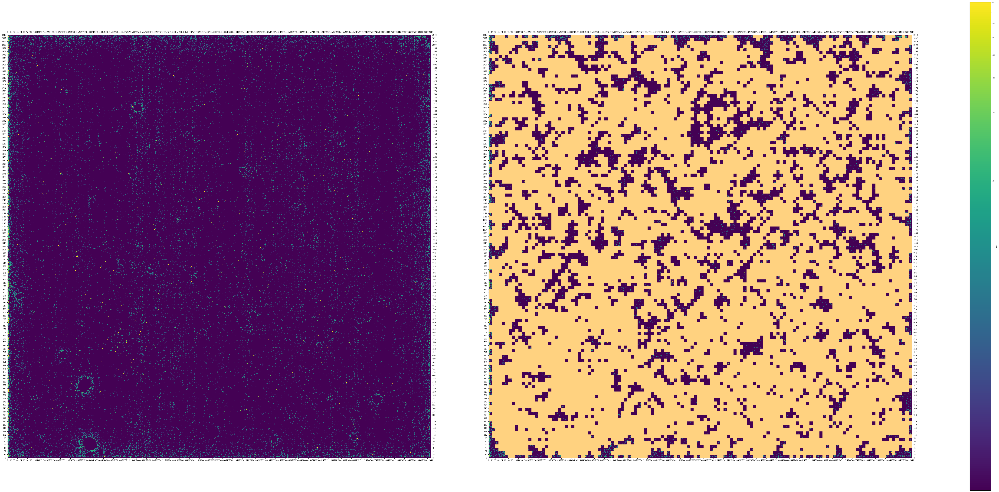

In [9]:
# 创建一个自定义的颜色映射，将掩膜区域设置为透明
cmap = cm.viridis
cmap.set_bad(color='orange', alpha=0.5) 

# 将掩膜应用于数据
masked_data = np.ma.array(photo, mask=bad_mask)
# bad pixel mask
#mask2 = (dq_map_2d>0)
#masked_data = np.ma.50rray(photo, mask=mask2)

norm = ImageNormalize(photo, interval=ManualInterval(vmin=20, vmax=400),stretch=LogStretch())

fig = plt.figure(figsize=(80, 40))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05])

ax1 = fig.add_subplot(gs[0])
im1 = ax1.imshow(photo, origin='lower',norm = norm)
# 设置网格
ax1.set_xticks(np.arange(-0.5, 2048, mosaic_size))
ax1.set_yticks(np.arange(-0.5, 2048, mosaic_size))
ax1.set_xticklabels(np.arange(0, 2048+1, mosaic_size))
ax1.set_yticklabels(np.arange(0, 2048+1, mosaic_size))
#ax1.grid(color='white', linestyle='-', linewidth=0.3)
#ax1.tick_params(axis='both', which='major', labelsize=4,top=True, bottom=True, left=True, right=True)
ax1.xaxis.set_tick_params(labeltop=True, labelbottom=True)
ax1.yaxis.set_tick_params(labelleft=True, labelright=True)

ax2 = fig.add_subplot(gs[1])
im2 = ax2.imshow(masked_data, cmap=cmap, origin='lower',norm = norm)
# 设置网格
ax2.set_xticks(np.arange(-0.5, 2048, mosaic_size))
ax2.set_yticks(np.arange(-0.5, 2048, mosaic_size))
ax2.set_xticklabels(np.arange(0, 2048+1, mosaic_size))
ax2.set_yticklabels(np.arange(0, 2048+1, mosaic_size))
#ax2.grid(color='white', linestyle='-', linewidth=0.3)
#ax2.tick_params(axis='both', which='major', labelsize=4,top=True, bottom=True, left=True, right=True)
ax2.xaxis.set_tick_params(labeltop=True, labelbottom=True)
ax2.yaxis.set_tick_params(labelleft=True, labelright=True)
# 添加一个共同的颜色条
cbar_ax = fig.add_subplot(gs[2])
cbar = fig.colorbar(im1, cax=cbar_ax)
cbar.set_label('DN',fontsize = 8)
cbar.ax.tick_params(labelsize=8)
plt.show()

peak of flagged but unmasked image at 5
peak of flagged and masked image at 5


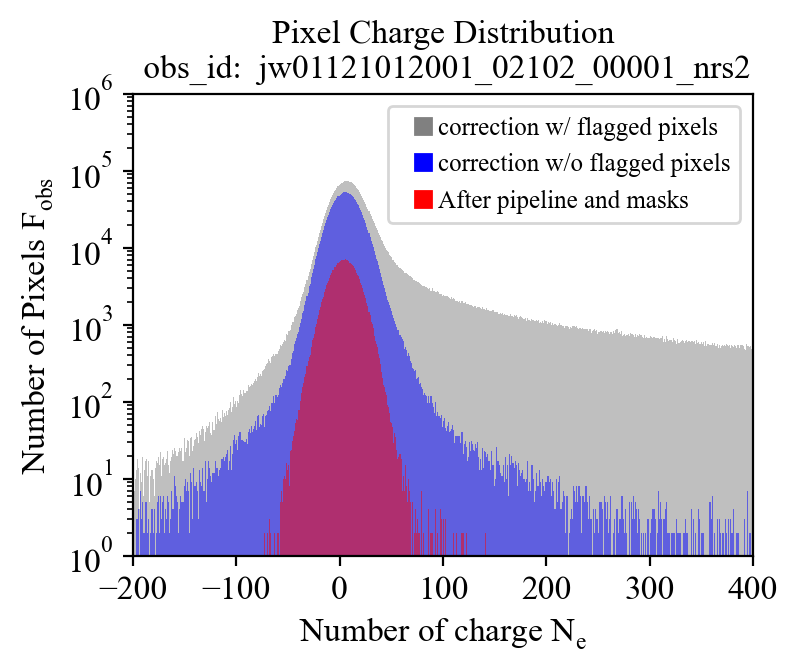

In [10]:
# 现在mask和原bad pixel mask合并
masked_indexes = np.where(mask)

# 需要五五分组平均吗？
c_regroup    = False
regroup_size = 4
if c_regroup:
    if n_group % regroup_size != 0:
        raise ValueError("第 2 维度的长度必须能被组大小整除")
    n_regroup = int(n_group / regroup_size)
    photo_regrouped = np.zeros((n_regroup, 2048, 2048))
    for i in range(n_regroup):
        photo_regrouped[i] = np.average(jump.data[0, i*regroup_size:(i+1)*regroup_size,:,:], axis = 0)
    raw_photo_3 = photo_regrouped[-1] - photo_regrouped[0]
else:
    raw_photo_3 = jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:]
raw_photo_3[dq_map_indexes] = np.nan
raw_photo_3[masked_indexes] = np.nan
raw_photo_flatten_3 = raw_photo_3.flatten()
nan_mask_3 = np.isnan(raw_photo_flatten_3)
photo_masked = raw_photo_flatten_3[~nan_mask_3]

plt.figure(figsize=(4, 3),dpi = 200)
fontsize = 12

plt.hist(pre_mask.flatten(), bins=range(dn_min, dn_max+1), alpha=0.5, color='gray', edgecolor=None, log=True)
good_counts, good_bin_edges, good_patched = plt.hist(photo_good_flatten, bins=range(dn_min, dn_max+1), alpha=0.5, color='blue',edgecolor=None, log=True)
masked_counts, masked_bin_edges, masked_patched = plt.hist(photo_masked, bins=range(dn_min, dn_max+1), alpha=0.5, color='red',edgecolor=None, log=True)
# 设置边缘颜色的透明度
#for patch in plt.gca().patches:
#    patch.set_edgecolor((1, 1, 1, 0.2))  # RGBA格式 (红, 绿, 蓝, 透明度)
plt.title('Pixel Charge Distribution\n obs_id:  ' + input_file_base, fontsize=fontsize)
plt.xlabel(r'Number of charge $N_e$', fontsize=fontsize)
plt.ylabel(r'Number of Pixels $F_{obs}$', fontsize=fontsize)
plt.xlim(dn_min,dn_max)
plt.ylim(1,1e6)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)

legend_elements = [
    Line2D([0], [0], color='gray', linestyle='None', marker='s', label='correction w/ flagged pixels'),
    Line2D([0], [0], color='b', linestyle='None',marker='s', label='correction w/o flagged pixels'),
    Line2D([0], [0], color='r', linestyle='None',marker='s', label='After pipeline and masks')
]

plt.legend(handles=legend_elements, fontsize=9, loc='upper right', handletextpad=-0.4, frameon=True)
good_peak = np.argmax(good_counts) + dn_min
masked_peak = np.argmax(masked_counts) + dn_min
print('peak of flagged but unmasked image at {}'.format(good_peak))
print('peak of flagged and masked image at {}'.format(masked_peak))
#print('{}% pixels left after mask'.format(np.sum(masked_counts)/np.sum(good_counts)*100))
plt.savefig("pixel_charge_distribution_after_pipeline_mask.pdf", format="pdf",bbox_inches="tight")
plt.show()

In [11]:
# How's everything fitted with Poission * Gaussian?
total_count = np.sum(masked_counts)
N_dn = masked_counts
sigma_dn = np.sqrt(N_dn)

dn_min_chi2 = masked_peak - 40
dn_max_chi2 = masked_peak + 40 + 1

#background analytical
def gaussian(x, mean, stddev):
    return  np.exp(-((x - mean) ** 2) / (2 * stddev ** 2)) / stddev / np.sqrt(2*np.pi)
def poisson(x, lambda_param):
    return np.exp(-lambda_param) * np.power(lambda_param, x) / gamma(x+1)

# x[0]:peak_rescale  x[1]:peak_center  x[2]:read_noise
def bkd_analy(x):
    bkd_analytical = np.zeros(dn_max-dn_min)
    for dn in range(0, dn_max):
        poisson_dn = poisson(dn, x[1])
        smear_min = np.max([round(dn - 5 * x[2]), dn_min])
        smear_max = np.min([round(dn + 5 * x[2]) + 1, dn_max])
        for dn_smear in range(smear_min, smear_max):
            bkd_analytical[dn_smear-dn_min] += poisson_dn * gaussian(dn_smear, dn, x[2])
    bkd_analytical = bkd_analytical * total_count * x[0]
    return bkd_analytical
def chi2_bkd(x):
    bkd_analytical = bkd_analy(x)
    chi2_0 = 0
    for k in range(dn_min_chi2-dn_min,dn_max_chi2-dn_min):
        if sigma_dn[k]!=0:
            chi2_0 += ((N_dn[k] - bkd_analytical[k]) / sigma_dn[k])**2
    return chi2_0

In [12]:
# 初始猜测值
initial_guess = [1, 10 ,14]
# 使用 minimize 函数寻找最小值
result = minimize(chi2_bkd, initial_guess)
# 输出结果
print(f"where minimum is at: {result.x}")
print(f"minimum: {result.fun}")

2024-12-02 12:07:52,766 - stpipe - WARNING - /tmp/ipykernel_5808/2612675274.py:13: RuntimeWarning: overflow encountered in power
  return np.exp(-lambda_param) * np.power(lambda_param, x) / gamma(x+1)

2024-12-02 12:07:52,766 - stpipe - WARNING - /tmp/ipykernel_5808/2612675274.py:13: RuntimeWarning: invalid value encountered in scalar divide
  return np.exp(-lambda_param) * np.power(lambda_param, x) / gamma(x+1)



where minimum is at: [ 0.99542778  4.02109547 13.72577494]
minimum: 194.75804139885201


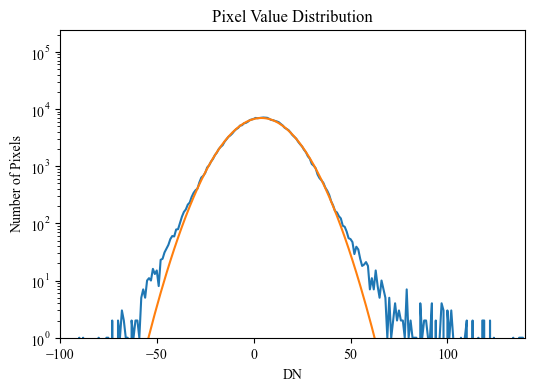

In [13]:
bkd_analytical = bkd_analy(result.x)

plt.figure(figsize=(6, 4))
plt.semilogy(dn_range, masked_counts)
plt.semilogy(dn_range, bkd_analytical)
plt.title('Pixel Value Distribution')
plt.xlabel('DN')
plt.ylabel('Number of Pixels')
plt.ylim(1,total_count)
plt.xlim(-100,140)
plt.show()

In [14]:
# 保存结果
# result = np.array([range(dn_min,dn_max), masked_counts]).T
# np.savetxt('./results/masked_pixel_value_distribution.txt',result)

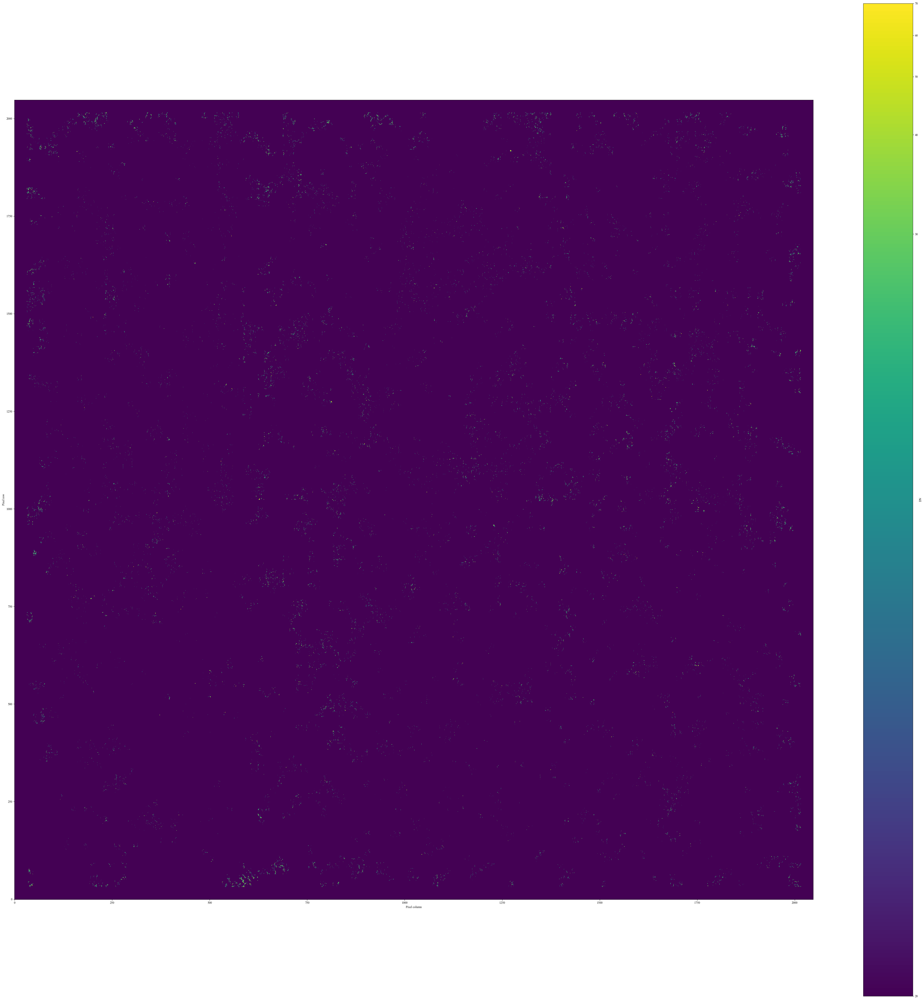

In [15]:
# 直接把bad pixels设成0才好作图先看一眼
photo_zero_mask = jump.data[0,photo_end,:,:] - jump.data[0,photo_start,:,:]
photo_zero_mask[dq_map_indexes] = 0
photo_zero_mask[masked_indexes] = 0

photo = photo_zero_mask
mask = np.zeros_like(photo, dtype=bool)
mask = (dq_map_2d > 0)

# 创建一个自定义的颜色映射，将掩膜区域设置为透明
cmap = cm.viridis
cmap.set_bad(color='orange', alpha=1) 

# 将掩膜应用于数据
masked_data = np.ma.array(photo, mask=mask)

norm = ImageNormalize(photo, interval=ManualInterval(vmin=20, vmax=70),stretch=LogStretch())
fig = plt.figure(figsize=(60, 60))

ax = fig.add_subplot(1, 1, 1)
im = ax.imshow(photo, origin='lower',norm = norm)

# 设置网格
#ax.set_xticks(np.arange(-0.5, 2048, 32))
#ax.set_yticks(np.arange(-0.5, 2048, 32))
#ax.set_xticklabels(np.arange(0, 2048+1, 32))
#ax.set_yticklabels(np.arange(0, 2048+1, 32))
#ax.grid(color='white', linestyle='-', linewidth=0.5)
#ax.tick_params(axis='both', which='major', labelsize=6,top=True, bottom=True, left=True, right=True)
#ax.xaxis.set_tick_params(labeltop=True, labelbottom=True)
#ax.yaxis.set_tick_params(labelleft=True, labelright=True)

fig.colorbar(im,label = 'DN')
plt.xlabel('Pixel column')
plt.ylabel('Pixel row')
plt.show()